In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
    
data = pd.read_csv('total_data.csv')
meta_data = pd.read_csv('data_summary.csv',
    usecols = ['Experiment', 'Wind_Dir', 'WindSpeed', 'boat.lat', 'boat.lon']
)

all_data_frames = []
for experiment in data.Experiment.unique():

    experiment_data = data[data['Experiment'] == experiment].copy()

    experiment_meta_data = meta_data[meta_data['Experiment'] == experiment]

    wind_dir = np.pi/2 - experiment_meta_data['Wind_Dir'].values[0]*np.pi/180
    wind_speed = experiment_meta_data['WindSpeed'].values[0]
    boat_lat = experiment_meta_data['boat.lat'].values[0]
    boat_lon = experiment_meta_data['boat.lon'].values[0]

    experiment_data['x_diff'] = (experiment_data['gps.lon'] - boat_lon)*np.cos(boat_lat*np.pi/180)*40075000/360
    experiment_data['y_diff'] = (experiment_data['gps.lat'] - boat_lat)*110000
    experiment_data['z'] = experiment_data['altitudeRelative']

    experiment_data['x'] =  -(experiment_data['x_diff']*np.cos(wind_dir) + experiment_data['y_diff']*np.sin(wind_dir))
    experiment_data['y'] = -experiment_data['x_diff']*np.sin(wind_dir) + experiment_data['y_diff']*np.cos(wind_dir)

    experiment_data['Concentration'] = experiment_data['Concentration']*100**3

    all_data_frames.append(experiment_data)

all_data = pd.concat(all_data_frames)




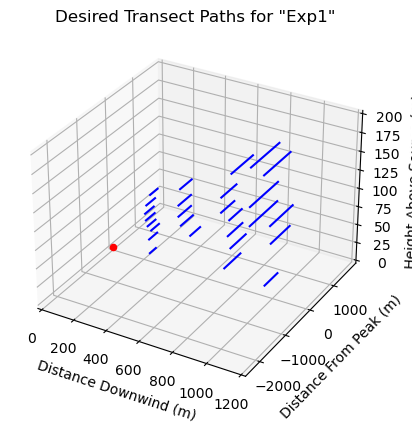

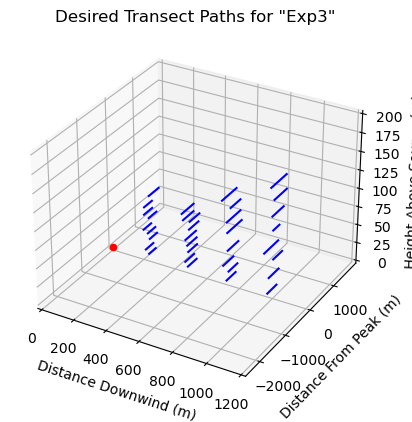

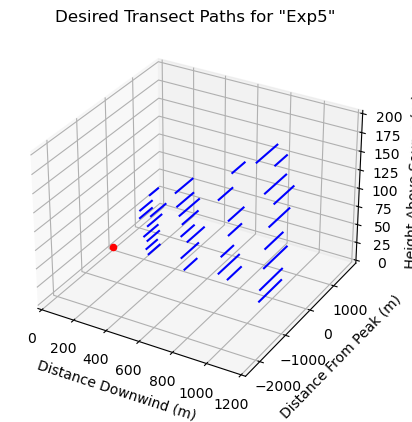

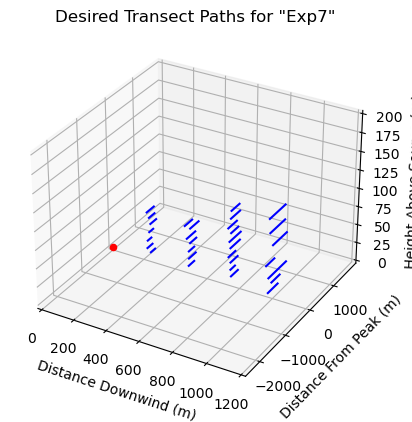

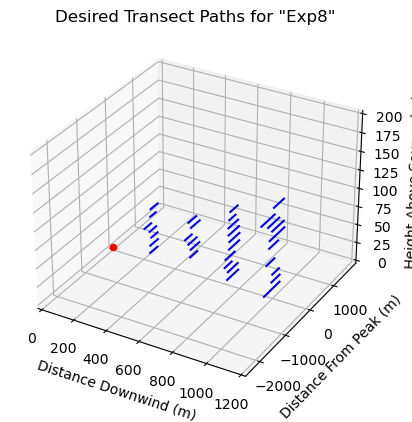

...

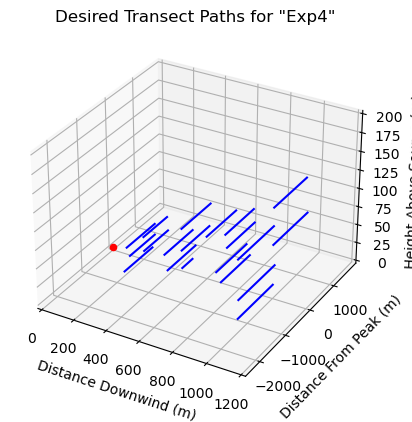

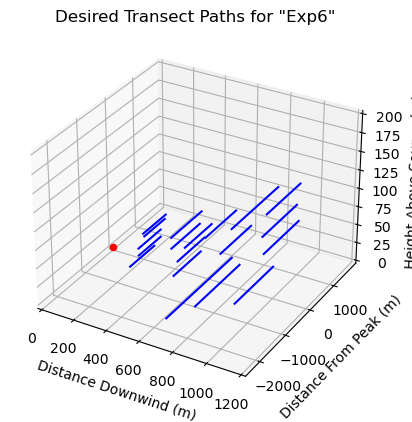

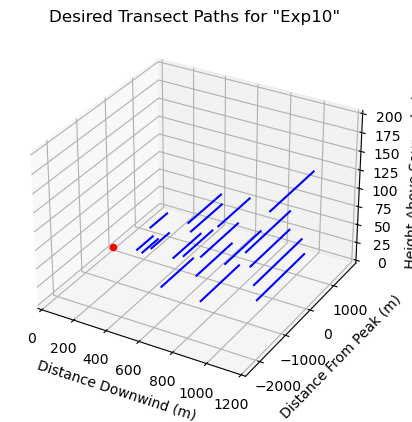

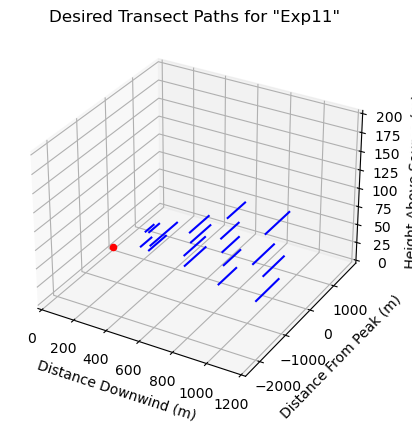

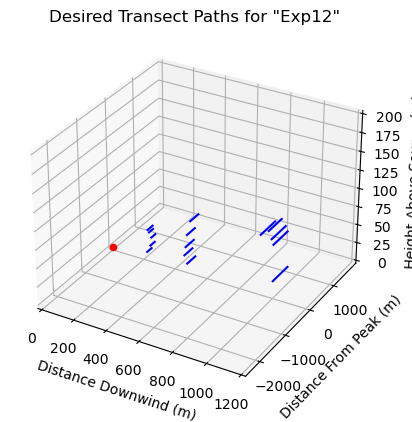

In [2]:
max_height = np.max(all_data.Height)
min_height = np.min(all_data.Height)
max_y = np.max(all_data.Peak_Dist)
min_y = np.min(all_data.Peak_Dist)
max_dist = np.max(all_data.Distance)
min_dist = np.min(all_data.Distance)

for experiment in all_data.Experiment.unique():
    ax = plt.axes(projection='3d')
    experiment_data = all_data[all_data.Experiment == experiment]

    for transect in experiment_data.Transect_Num.unique():
        transect_data = experiment_data[experiment_data.Transect_Num == transect]
        
        ax.plot3D(transect_data.Distance, transect_data.Peak_Dist, transect_data.Height,'blue')   
        ax.axes.set_xlim3d(left=0, right=max_dist + 200) 
        ax.axes.set_ylim3d(bottom=min_y, top=max_y) 
        ax.axes.set_zlim3d(bottom=0, top=max_height)

    ax.scatter3D([0],[0],[0],s=20,c='r')
    ax.set_xlabel('Distance Downwind (m)')
    ax.set_ylabel('Distance From Peak (m)')
    ax.set_zlabel('Height Above Source (m)')
    ax.set_title('Desired Transect Paths for \"' + experiment + '\"')
    plt.show()

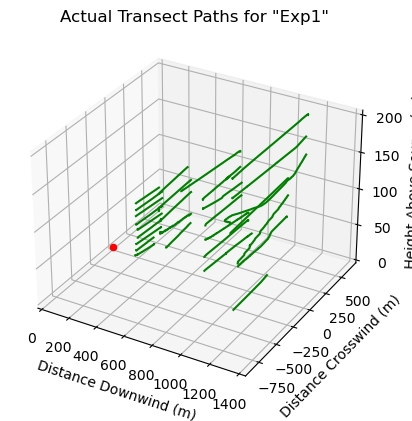

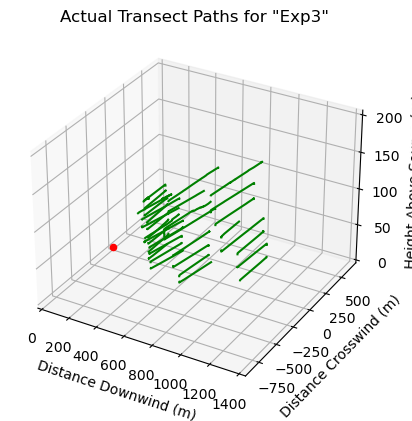

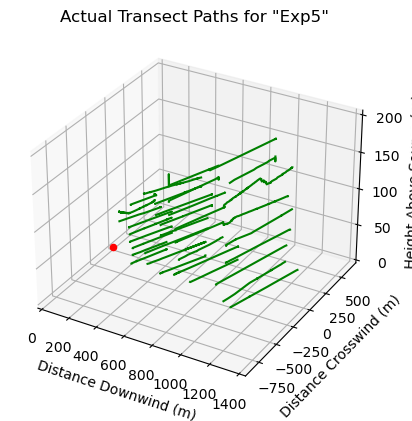

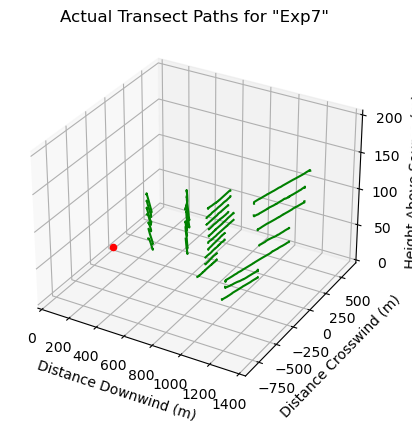

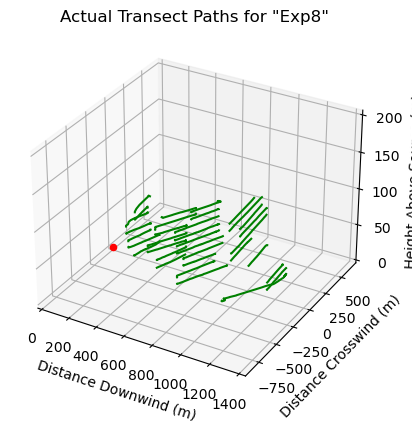

...

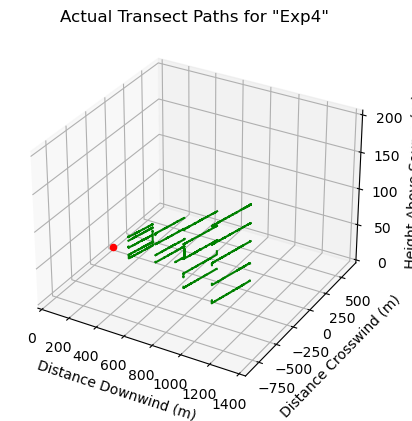

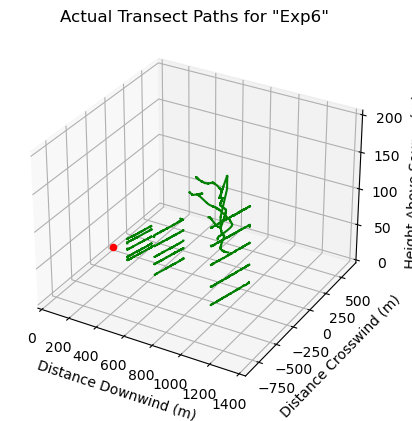

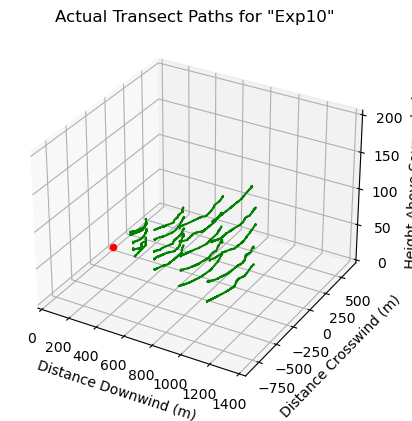

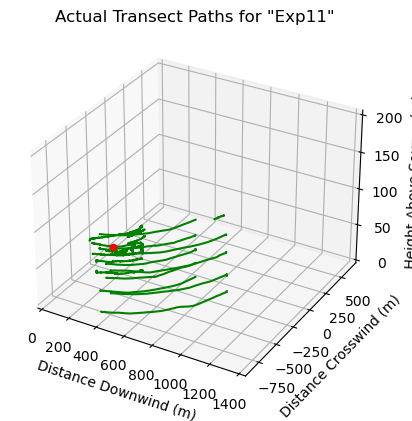

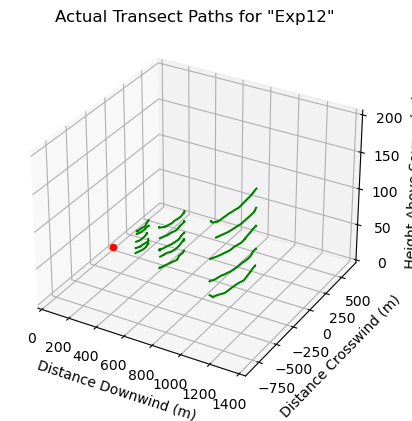

In [3]:
max_height = np.max(all_data.z)
min_height = np.min(all_data.z)
max_y = np.max(all_data.y)
min_y = np.min(all_data.y)
max_dist = np.max(all_data.x)
min_dist = np.min(all_data.x)

for experiment in all_data.Experiment.unique():
    ax = plt.axes(projection='3d')
    experiment_data = all_data[all_data.Experiment == experiment]

    for transect in experiment_data.Transect_Num.unique():
        transect_data = experiment_data[experiment_data.Transect_Num == transect]
        
        ax.plot3D(transect_data.x, transect_data.y, transect_data.z,'green')   
        ax.axes.set_xlim3d(left=0, right=max_dist + 200) 
        ax.axes.set_ylim3d(bottom=min_y, top=max_y) 
        ax.axes.set_zlim3d(bottom=0, top=max_height)

    ax.scatter3D([0],[0],[0],s=20,c='r')
    ax.set_xlabel('Distance Downwind (m)')
    ax.set_ylabel('Distance Crosswind (m)')
    ax.set_zlabel('Height Above Source (m)')
    ax.set_title('Actual Transect Paths for \"' + experiment + '\"')
    plt.show()

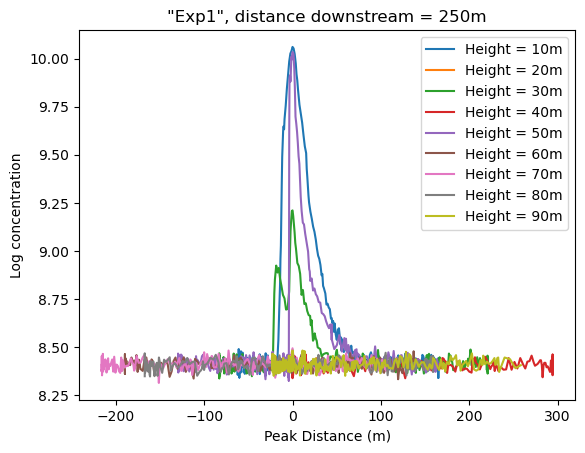

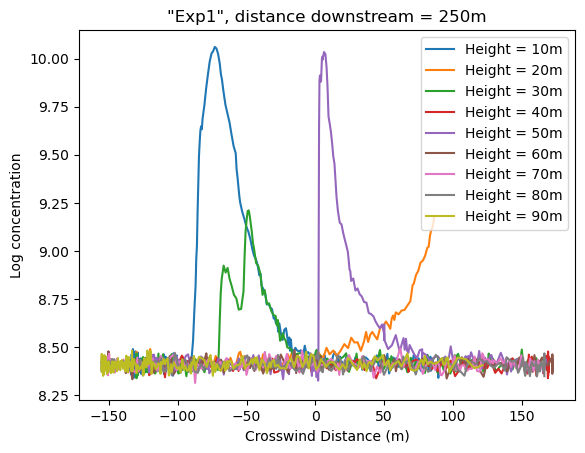

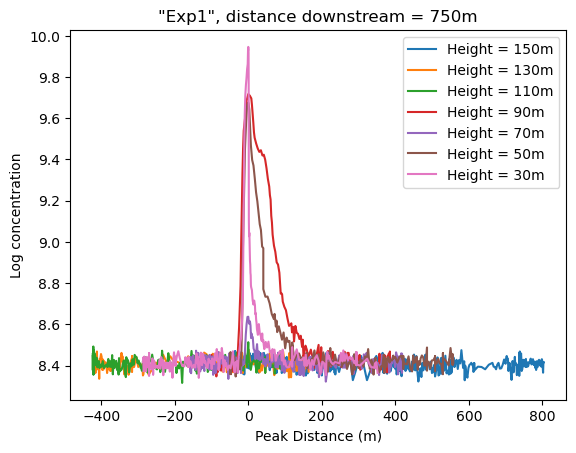

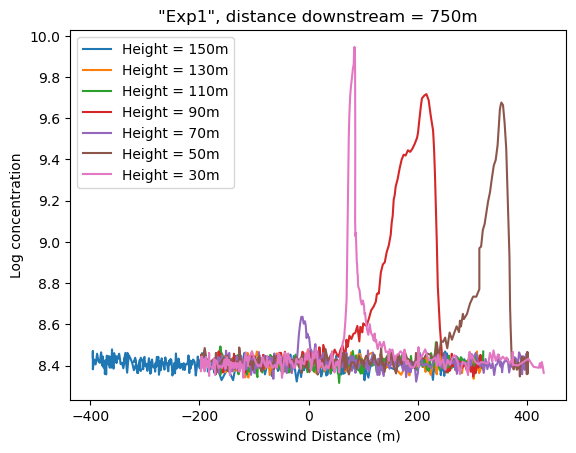

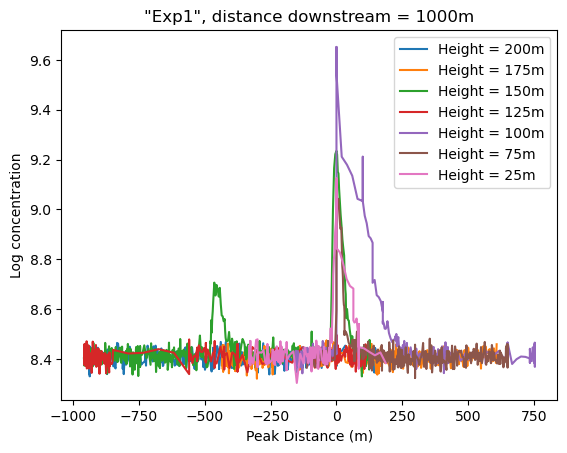

...

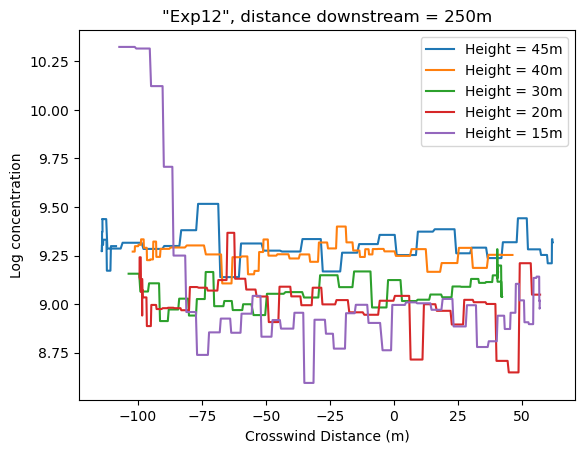

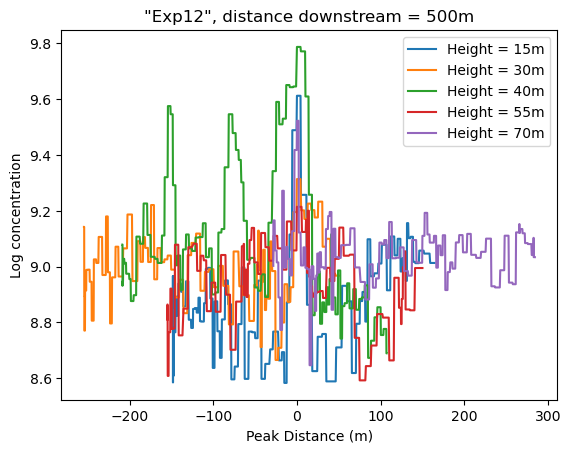

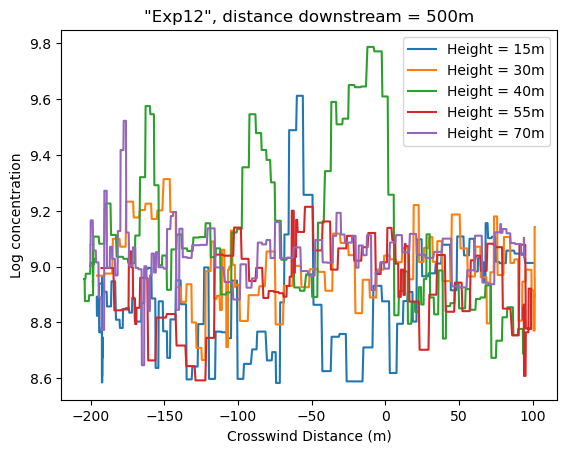

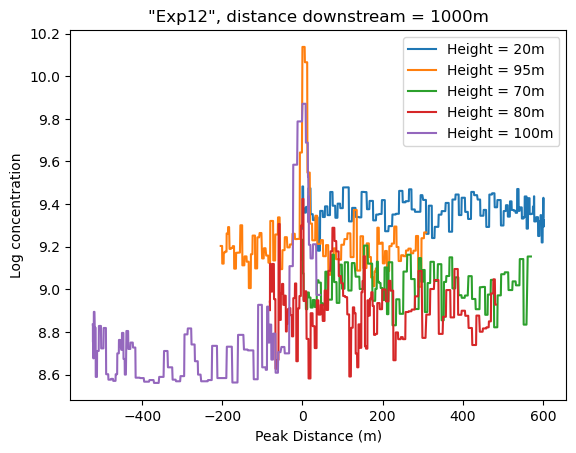

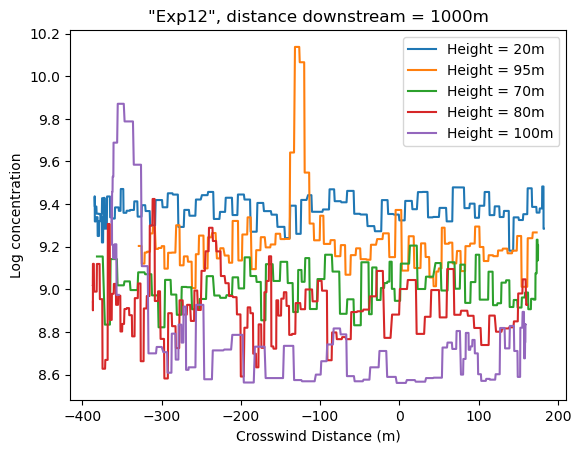

In [11]:
for experiment in all_data.Experiment.unique():
    experiment_data = all_data[all_data.Experiment == experiment]

    for distance in experiment_data.Distance.unique():
        distance_data = experiment_data[experiment_data['Distance'] == distance]
        for height in distance_data.Height.unique():
            height_data = distance_data[distance_data['Height'] == height]
            plt.plot(height_data.Peak_Dist, np.log10(height_data.Concentration), label = 'Height = ' + str(height) + 'm')
        plt.xlabel('Peak Distance (m)')
        plt.ylabel('Log concentration')
        plt.title('\"' + experiment + '\"' + ', distance downstream = ' + str(distance) + 'm')
        plt.legend()
        plt.show()

        for height in distance_data.Height.unique():
            height_data = distance_data[distance_data['Height'] == height]
            plt.plot(height_data.y, np.log10(height_data.Concentration), label = 'Height = ' + str(height) + 'm')
        plt.xlabel('Crosswind Distance (m)')
        plt.ylabel('Log concentration')
        plt.title('\"' + experiment + '\"' + ', distance downstream = ' + str(distance) + 'm')
        plt.legend()
        plt.show()

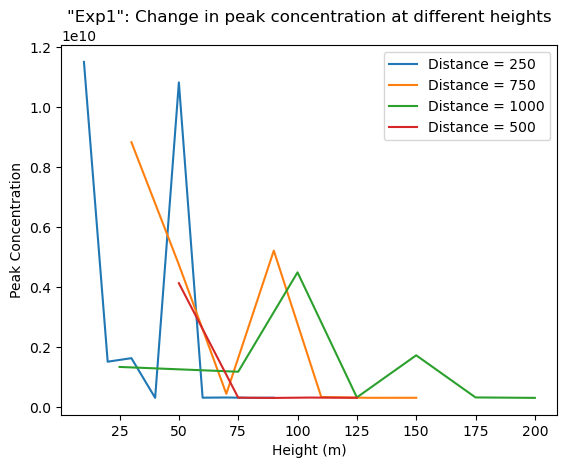

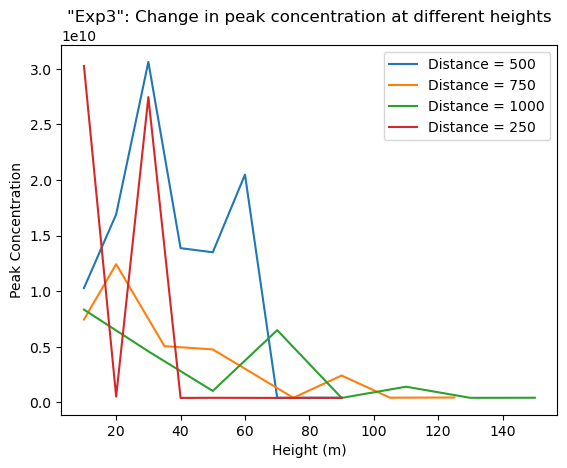

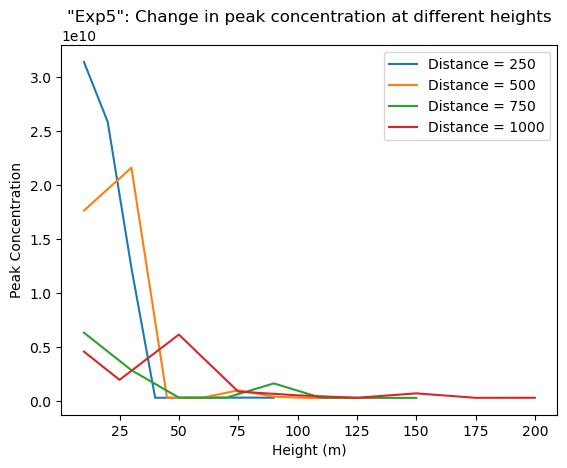

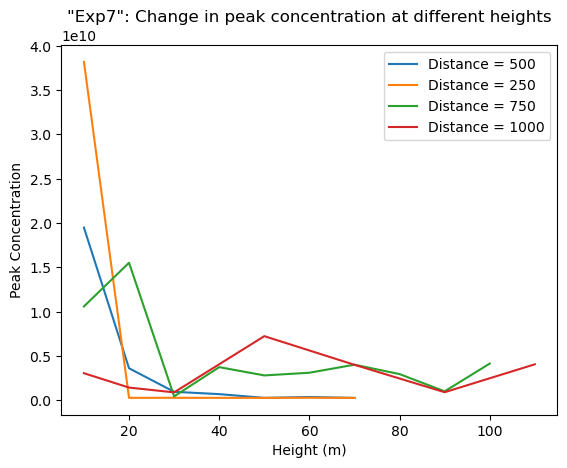

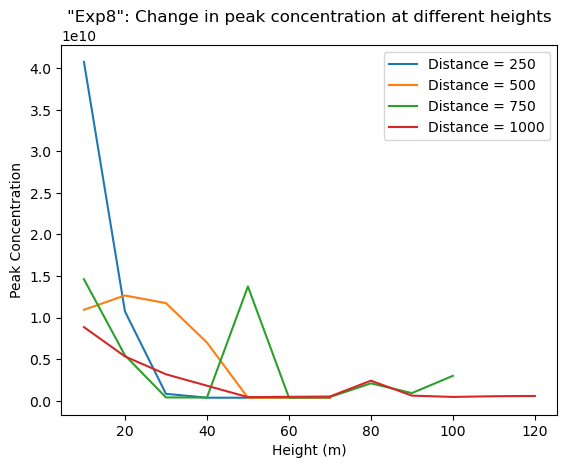

...

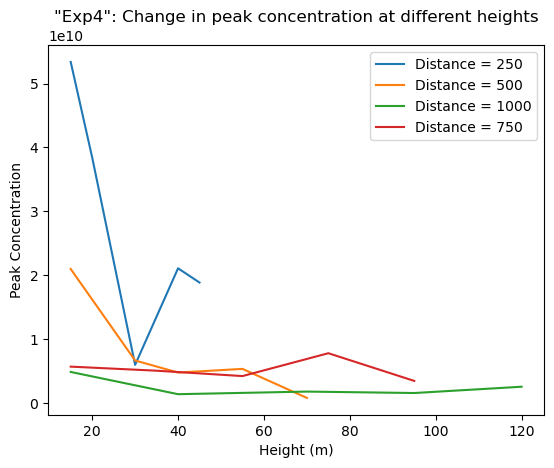

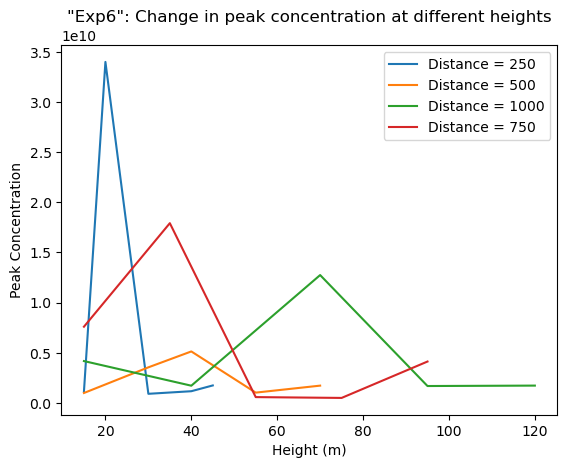

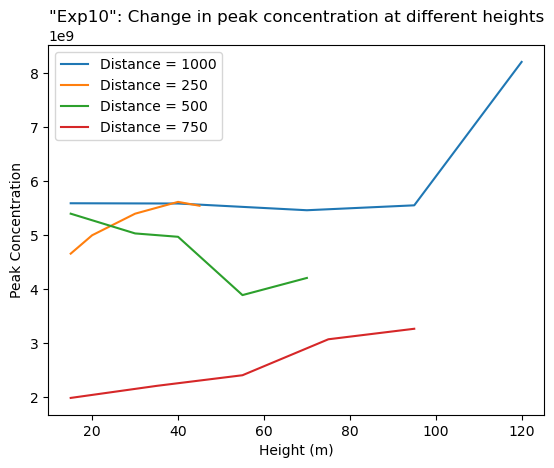

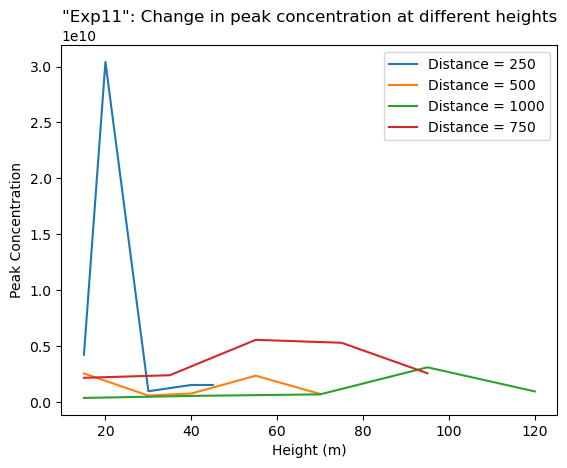

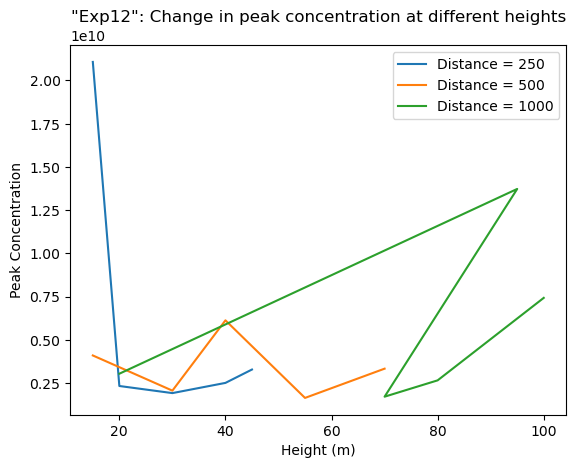

In [12]:
for experiment in all_data.Experiment.unique():
    experiment_data = all_data[all_data.Experiment == experiment]
    for distance in experiment_data.Distance.unique():
        distance_data = experiment_data[experiment_data['Distance'] == distance]
        peaks = []
        heights = []
        for height in distance_data.Height.unique():
            height_data = distance_data[distance_data['Height'] == height]
            peaks.append(np.max(height_data.Concentration))
            heights.append(height)
        plt.plot(heights,peaks,label = 'Distance = ' + str(distance))
        
    plt.xlabel('Height (m)')
    plt.ylabel('Peak Concentration')
    plt.title('\"' + experiment + '\": ' + 'Change in peak concentration at different heights')
    plt.legend()
    plt.show()

The Gaussian Plume Model is written as either:
